# Face Comparation

In [223]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
import shap

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import VarianceThreshold,SelectKBest,RFE
from sklearn.feature_selection import chi2,f_classif, mutual_info_classif
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, plot_confusion_matrix, auc, roc_curve
from sklearn.metrics import fowlkes_mallows_score
from sklearn.metrics import silhouette_score

In [224]:
# Load dataset
df = pd.read_csv("dataset/dataset_ktp_train.csv")
df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/test\1590484072315_0,0.36298,0.747817,0.633046,0.356281,23,1,9.73339e+06,0
1,face_cropping/test\1590484321949_0,0.439289,0.772675,0.651281,0.455874,19,0,1.12965e+07,0
2,face_cropping/test\1590484360364_0,0.411213,0.769965,0.813915,0.418015,15,0,1.60879e+07,0
3,face_cropping/test\1590484379875_1,0.489742,0.763175,0.585885,0.495408,11,1,2.06029e+07,1
4,face_cropping/test\1590484423008_0,0.365846,1.01675,0.833037,0.398158,6,0,1.22127e+07,0
5,face_cropping/test\1590484444798_1,0.599331,1.09454,0.964321,0.65106,2,0,4.08477e+07,1
6,face_cropping/test\1590484887269_1,0.600841,0.507913,0.575734,0.547519,57,0,5.92171e+06,1
7,face_cropping/test\1590488487337_0,0.450191,0.77654,0.813851,0.461636,2,0,1.80666e+07,0
8,face_cropping/test\1590488578507_0,nan,nan,nan,0.553834,122,1,1.7146e+07,0
9,face_cropping/test\1590488635335_1,0.606447,0.690702,0.768882,0.613621,10,0,8.80487e+06,1


In [225]:
# Data distribution
df["target"].value_counts()

1    50
0    50
Name: target, dtype: int64

In [226]:
# Drop NaN data
df.dropna()

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/test\1590484072315_0,0.362980,0.747817,0.633046,0.356281,23,1,9.733387e+06,0
1,face_cropping/test\1590484321949_0,0.439289,0.772675,0.651281,0.455874,19,0,1.129651e+07,0
2,face_cropping/test\1590484360364_0,0.411213,0.769965,0.813915,0.418015,15,0,1.608791e+07,0
3,face_cropping/test\1590484379875_1,0.489742,0.763175,0.585885,0.495408,11,1,2.060287e+07,1
4,face_cropping/test\1590484423008_0,0.365846,1.016754,0.833037,0.398158,6,0,1.221274e+07,0
...,...,...,...,...,...,...,...,...,...
95,face_cropping/test\a_1590931614272_15909266305...,0.706879,1.227599,1.115512,0.716747,0,0,7.835833e+06,1
96,face_cropping/test\a_1590931783332_15909296580...,0.546294,1.102502,1.116556,0.573692,8,1,1.052189e+07,1
97,face_cropping/test\a_1590931783332_15909297722...,0.713846,1.273538,1.209489,0.678559,3,1,1.287447e+07,1
98,face_cropping/test\a_1590932247973_15904843219...,0.687107,0.786390,0.688826,0.661811,63,0,8.293745e+06,1


## Find threshold

In [227]:
interval = 0.025
range = np.arange(0.2, 1.5 + interval, interval)

In [228]:
fr_accuracy = []
fr_f1_score = []
of_OEN_accuracy = []
of_OEN_f1_score = []
of_IEBL_accuracy = []
of_IEBL_f1_score = []
dlib_model_accuracy = []
dlib_model_f1_score = []

for i,val in enumerate(range):
    fr_pred = list(map(lambda x: 1 if(x>val) else 0, df.dropna(subset=["face_recognition_dst"])["face_recognition_dst"]))
    fr_accuracy.append(accuracy_score(df.dropna(subset=["face_recognition_dst"])["target"], fr_pred))
    fr_f1_score.append(f1_score(df.dropna(subset=["face_recognition_dst"])["target"], fr_pred))
    
    of_pred = list(map(lambda x: 1 if(x>val) else 0, df.dropna(subset=["openface_OEN_dst"])["openface_OEN_dst"]))
    of_OEN_accuracy.append(accuracy_score(df.dropna(subset=["openface_OEN_dst"])["target"], of_pred))
    of_OEN_f1_score.append(f1_score(df.dropna(subset=["openface_OEN_dst"])["target"], of_pred))
    
    of_pred = list(map(lambda x: 1 if(x>val) else 0, df.dropna(subset=["openface_IEBL_dst"])["openface_IEBL_dst"]))
    of_IEBL_accuracy.append(accuracy_score(df.dropna(subset=["openface_IEBL_dst"])["target"], of_pred))
    of_IEBL_f1_score.append(f1_score(df.dropna(subset=["openface_IEBL_dst"])["target"], of_pred))
    
    dlib_model_pred = list(map(lambda x: 1 if(x>val) else 0, df.dropna(subset=["dlib_trained_model"])["dlib_trained_model"]))
    dlib_model_accuracy.append(accuracy_score(df.dropna(subset=["dlib_trained_model"])["target"], dlib_model_pred))
    dlib_model_f1_score.append(f1_score(df.dropna(subset=["dlib_trained_model"])["target"], dlib_model_pred))

In [229]:
min_pca_val = df.min()['pca_eigenface_dst']
max_pca_val = df.max()['pca_eigenface_dst']
range_pca = np.arange(min_pca_val, max_pca_val, (max_pca_val-min_pca_val)/100)

pca_accuracy = []
pca_f1_score = []

for i,val in enumerate(range_pca):
    pred = list(map(lambda x: 1 if(x>val) else 0, df['pca_eigenface_dst']))
    pca_accuracy.append(accuracy_score(df['target'], pred))
    pca_f1_score.append(f1_score(df['target'], pred))

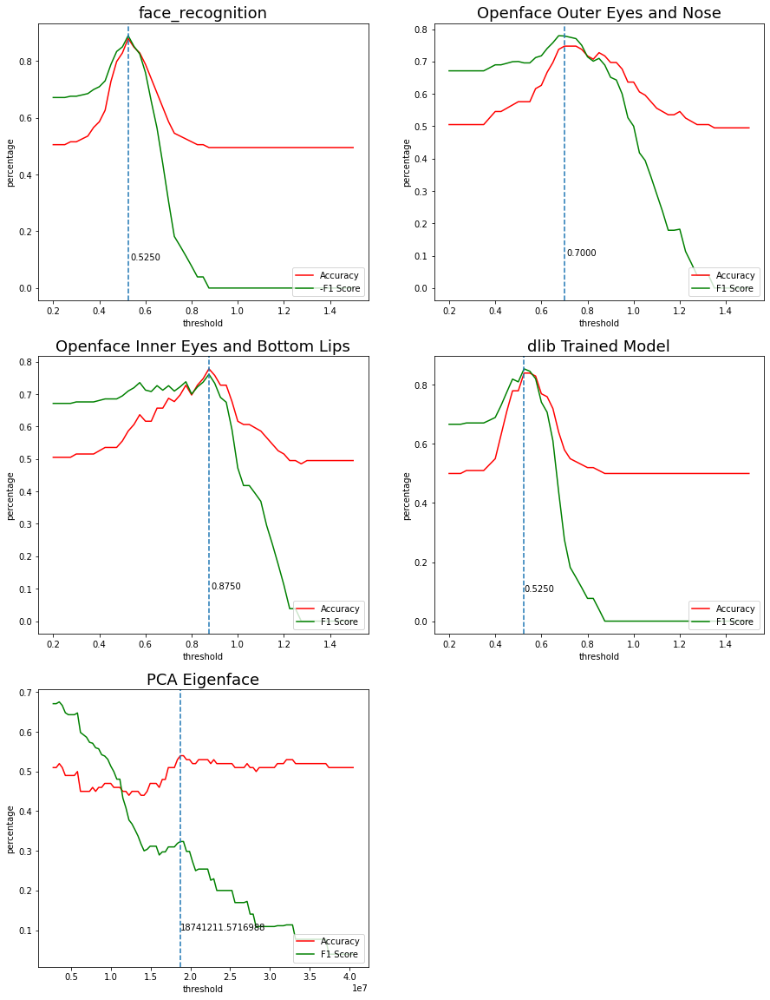

In [230]:
fig = plt.figure(figsize=(15, 20))

threshold = range[np.where(fr_accuracy == np.amax(fr_accuracy))[0]][0]
f1 = plt.subplot(3,2,1)
plt.plot(range,fr_accuracy,'r', label='Accuracy')
plt.plot(range,fr_f1_score,'g', label='-F1 Score')
plt.title('face_recognition', fontsize=18)
plt.axvline(threshold, linestyle= '--')
plt.text(threshold+0.01,0.1,"{:.4f}".format(threshold))
plt.ylabel('percentage')
plt.xlabel('threshold')
plt.legend(loc='lower right')

plt.subplot(3,2,2)
threshold = range[np.where(of_OEN_accuracy == np.amax(of_OEN_accuracy))[0]][0]
plt.plot(range,of_OEN_accuracy,'r', label='Accuracy')
plt.plot(range,of_OEN_f1_score,'g', label='F1 Score')
plt.title('Openface Outer Eyes and Nose', fontsize=18)
plt.axvline(threshold, linestyle= '--')
plt.text(threshold+0.01,0.1,"{:.4f}".format(threshold))
plt.ylabel('percentage')
plt.xlabel('threshold')
plt.legend(loc='lower right')

plt.subplot(3,2,3)
threshold = range[np.where(of_IEBL_accuracy == np.amax(of_IEBL_accuracy))[0]][0]
plt.plot(range,of_IEBL_accuracy,'r', label='Accuracy')
plt.plot(range,of_IEBL_f1_score,'g', label='F1 Score')
plt.title('Openface Inner Eyes and Bottom Lips', fontsize=18)
plt.axvline(threshold, linestyle= '--')
plt.text(threshold+0.01,0.1,"{:.4f}".format(threshold))
plt.ylabel('percentage')
plt.xlabel('threshold')
plt.legend(loc='lower right')

plt.subplot(3,2,4)
threshold = range[np.where(dlib_model_accuracy == np.amax(dlib_model_accuracy))[0]][0]
plt.plot(range,dlib_model_accuracy,'r', label='Accuracy')
plt.plot(range,dlib_model_f1_score,'g', label='F1 Score')
plt.title('dlib Trained Model', fontsize=18)
plt.axvline(threshold, linestyle= '--')
plt.text(threshold,0.1,"{:.4f}".format(threshold))
plt.ylabel('percentage')
plt.xlabel('threshold')
plt.legend(loc='lower right')

plt.subplot(3,2,5)
threshold = range_pca[np.where(pca_accuracy == np.amax(pca_accuracy))[0]][0]
plt.plot(range_pca,pca_accuracy,'r', label='Accuracy')
plt.plot(range_pca,pca_f1_score,'g', label='F1 Score')
plt.title('PCA Eigenface', fontsize=18)
plt.axvline(threshold, linestyle= '--')
plt.text(threshold+0.01,0.1,"{:.7f}".format(threshold))
plt.ylabel('percentage')
plt.xlabel('threshold')
plt.legend(loc='lower right')

plt.show(); 

## Data Distribution

invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less_equal
invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater_equal
invalid value encountered in less

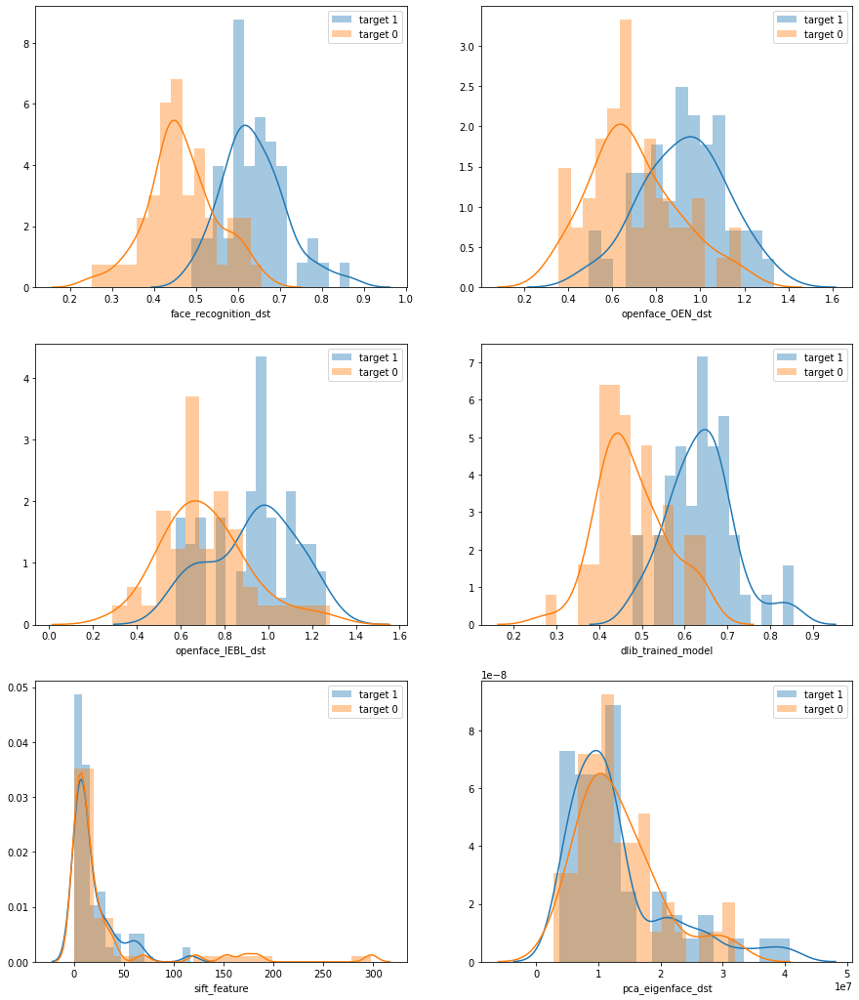

In [231]:
fig = plt.figure(figsize=(15, 18))

plt.subplot(3,2,1)
sns.distplot(df.where(df["target"]==1)["face_recognition_dst"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["face_recognition_dst"], bins =15, label="target 0")
plt.legend()

plt.subplot(3,2,2)
sns.distplot(df.where(df["target"]==1)["openface_OEN_dst"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["openface_OEN_dst"], bins =15, label="target 0")
plt.legend()

plt.subplot(3,2,3)
sns.distplot(df.where(df["target"]==1)["openface_IEBL_dst"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["openface_IEBL_dst"], bins =15, label="target 0")
plt.legend()

plt.subplot(3,2,4)
sns.distplot(df.where(df["target"]==1)["dlib_trained_model"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["dlib_trained_model"], bins =15, label="target 0")
plt.legend()

plt.subplot(3,2,5)
sns.distplot(df.where(df["target"]==1)["sift_feature"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["sift_feature"], bins =15, label="target 0")
plt.legend()

plt.subplot(3,2,6)
sns.distplot(df.where(df["target"]==1)["pca_eigenface_dst"], bins =15, label="target 1")
sns.distplot(df.where(df["target"]==0)["pca_eigenface_dst"], bins =15, label="target 0")
plt.legend()

plt.show();  

## Correlation matrix

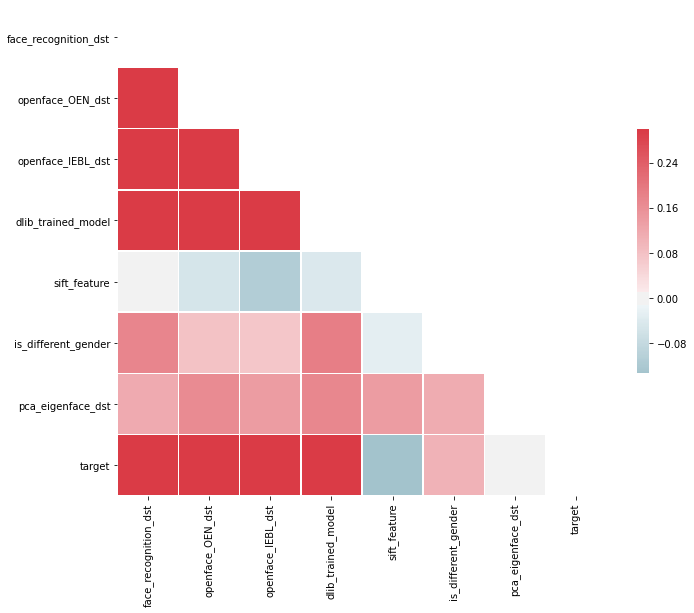

In [232]:
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Data Preprocessing

In [233]:
train_prep = df

In [234]:
# Drop NaN data
train_prep = train_prep.dropna()

In [235]:
train_prep

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/test\1590484072315_0,0.362980,0.747817,0.633046,0.356281,23,1,9.733387e+06,0
1,face_cropping/test\1590484321949_0,0.439289,0.772675,0.651281,0.455874,19,0,1.129651e+07,0
2,face_cropping/test\1590484360364_0,0.411213,0.769965,0.813915,0.418015,15,0,1.608791e+07,0
3,face_cropping/test\1590484379875_1,0.489742,0.763175,0.585885,0.495408,11,1,2.060287e+07,1
4,face_cropping/test\1590484423008_0,0.365846,1.016754,0.833037,0.398158,6,0,1.221274e+07,0
...,...,...,...,...,...,...,...,...,...
95,face_cropping/test\a_1590931614272_15909266305...,0.706879,1.227599,1.115512,0.716747,0,0,7.835833e+06,1
96,face_cropping/test\a_1590931783332_15909296580...,0.546294,1.102502,1.116556,0.573692,8,1,1.052189e+07,1
97,face_cropping/test\a_1590931783332_15909297722...,0.713846,1.273538,1.209489,0.678559,3,1,1.287447e+07,1
98,face_cropping/test\a_1590932247973_15904843219...,0.687107,0.786390,0.688826,0.661811,63,0,8.293745e+06,1


## Split Training Data & Test Data

In [236]:
train_x_attr = train_prep.drop(columns=['name','is_different_gender','target'])
train_y_attr = train_prep['target']

train_x, test_x, train_y, test_y = train_test_split(train_x_attr.values, train_y_attr.values, test_size=0.33, random_state=24042020)

In [237]:
test_acc_res = []
test_prec_res = []
test_rec_res = []
test_f1_res = []
cv_train_acc_res = []
cv_train_prec_res = []
cv_train_rec_res = []
cv_test_acc_res = []
cv_test_prec_res = []
cv_test_rec_res = []

## Decision Tree Classifier

In [238]:
clf_tree = DecisionTreeClassifier().fit(train_x, train_y)

### Result using Test Data

Decision tree result using Test Data: 
-------------------------
Accuracy: 81.81818181818183 %
Precision: 93.33333333333333 %
Recall: 73.68421052631578 %
F1-score: 82.35294117647058 %
Confusion Matrix:


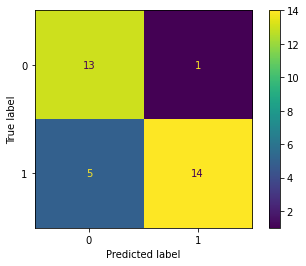

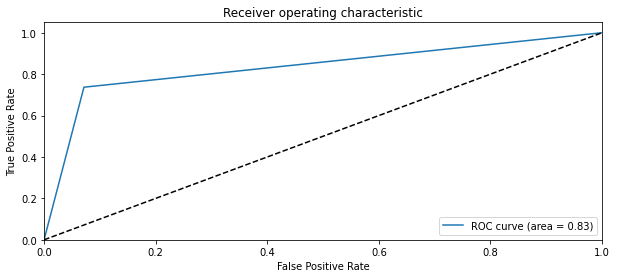

In [239]:
tree_pred = clf_tree.predict(test_x)
print("Decision tree result using Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_y, tree_pred) * 100))
print("Precision: {} %".format(precision_score(test_y, tree_pred) * 100))
print("Recall: {} %".format(recall_score(test_y, tree_pred) * 100))
print("F1-score: {} %".format(f1_score(test_y, tree_pred) * 100))
print("Confusion Matrix:")
plot_confusion_matrix(clf_tree, test_x, test_y)

y_pred_proba = clf_tree.predict_proba(test_x)

fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba[:,1])

auc_score = auc(fpr, tpr)

plt.figure(figsize=(10,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % (auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [240]:
test_acc_res.append(accuracy_score(test_y, tree_pred) * 100)
test_prec_res.append(precision_score(test_y, tree_pred) * 100)
test_rec_res.append(recall_score(test_y, tree_pred) * 100)
test_f1_res.append(f1_score(test_y, tree_pred) * 100)

### Cross Validate

In [241]:
classifier_tree = DecisionTreeClassifier()
score_tree = cross_validate(classifier_tree, train_x_attr, train_y_attr, cv=5, scoring=('accuracy', 'precision', 'recall'), return_train_score=True)

print("Cross Validation Decision Tree Result")
print("Train Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100))
print("Test Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100))

Cross Validation Decision Tree Result
Train Averaged Scores
Accuracy: 100.0 %
Precision: 100.0 %
Recall: 100.0 %
Test Averaged Scores
Accuracy: 72.84210526315789 %
Precision: 77.83239962651727 %
Recall: 73.99999999999999 %


In [242]:
cv_train_acc_res.append(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100)
cv_train_prec_res.append(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100)
cv_train_rec_res.append(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100)
cv_test_acc_res.append(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100)
cv_test_prec_res.append(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100)
cv_test_rec_res.append(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100)

### Feature Importance

Feature: 0, Score: 0.59602
Feature: 1, Score: 0.05069
Feature: 2, Score: 0.00000
Feature: 3, Score: 0.09124
Feature: 4, Score: 0.16024
Feature: 5, Score: 0.10181


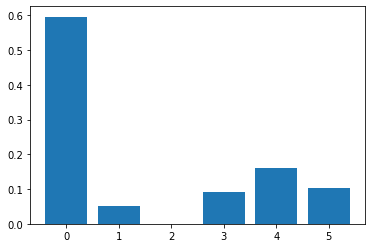

In [245]:
importance_decision_tree = clf_tree.feature_importances_

for i,v in enumerate(importance_decision_tree):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_decision_tree))], importance_decision_tree)
plt.show()

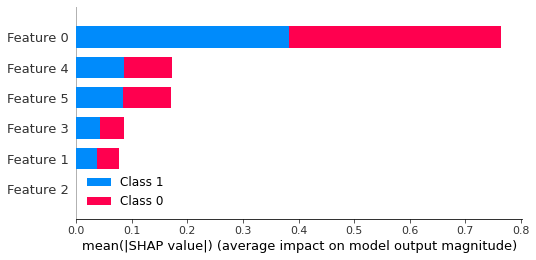

In [246]:
shap_values = shap.TreeExplainer(clf_tree).shap_values(train_x)
shap.summary_plot(shap_values, train_x, plot_type="bar")

## Random Forest Classifier

In [247]:
clf = RandomForestClassifier(max_depth=2, random_state=0).fit(train_x, train_y)

### Result using Test Data

Random Forest Classifier result using Test Data: 
-------------------------
Accuracy: 90.9090909090909 %
Precision: 94.44444444444444 %
Recall: 89.47368421052632 %
F1-score: 91.8918918918919 %
Confusion Matrix:


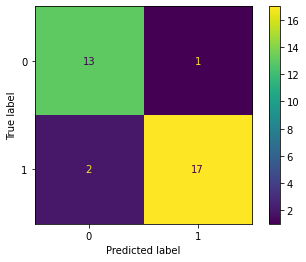

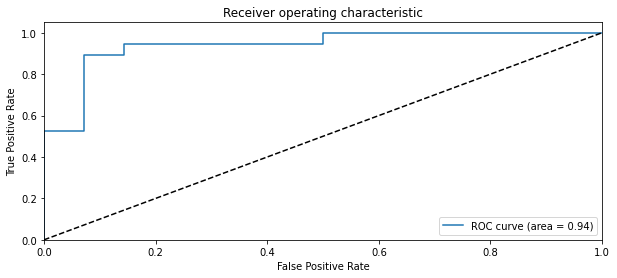

In [248]:
pred = clf.predict(test_x)
print("Random Forest Classifier result using Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_y, pred) * 100))
print("Precision: {} %".format(precision_score(test_y, pred) * 100))
print("Recall: {} %".format(recall_score(test_y, pred) * 100))
print("F1-score: {} %".format(f1_score(test_y, pred) * 100))
print("Confusion Matrix:")
plot_confusion_matrix(clf, test_x, test_y)

y_pred_proba = clf.predict_proba(test_x)

fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba[:,1])

auc_score = auc(fpr, tpr)

plt.figure(figsize=(10,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % (auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [249]:
test_acc_res.append(accuracy_score(test_y, pred) * 100)
test_prec_res.append(precision_score(test_y, pred) * 100)
test_rec_res.append(recall_score(test_y, pred) * 100)
test_f1_res.append(f1_score(test_y, pred) * 100)

### Cross validation

In [250]:
rf_classifier = RandomForestClassifier(max_depth=2, random_state=0)
score_tree = cross_validate(rf_classifier, train_x_attr, train_y_attr, cv=5, scoring=('accuracy', 'precision', 'recall'), return_train_score=True)

print("Cross Validation Random Forest Result")
print("Train Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100))
print("Test Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100))

Cross Validation Random Forest Result
Train Averaged Scores
Accuracy: 89.64873417721519 %
Precision: 86.40527223454052 %
Recall: 94.5 %
Test Averaged Scores
Accuracy: 84.89473684210526 %
Precision: 84.44444444444444 %
Recall: 90.0 %


In [251]:
cv_train_acc_res.append(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100)
cv_train_prec_res.append(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100)
cv_train_rec_res.append(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100)
cv_test_acc_res.append(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100)
cv_test_prec_res.append(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100)
cv_test_rec_res.append(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100)

### Feature Importance

Feature: 0, Score: 0.31998
Feature: 1, Score: 0.16889
Feature: 2, Score: 0.09124
Feature: 3, Score: 0.32171
Feature: 4, Score: 0.04311
Feature: 5, Score: 0.05507


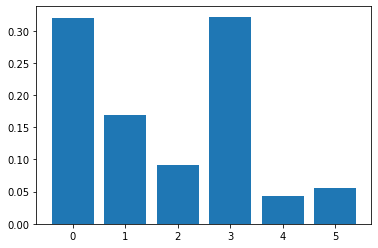

In [252]:
importance_random_forest = clf.feature_importances_

for i,v in enumerate(importance_random_forest):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_random_forest))], importance_random_forest)
plt.show()

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


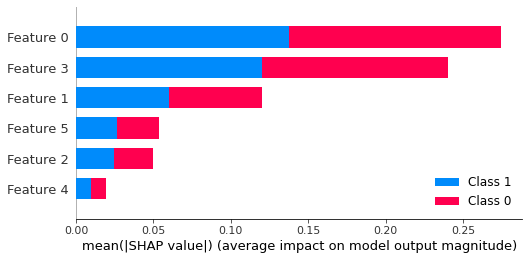

In [253]:
shap_values = shap.TreeExplainer(clf).shap_values(train_x)
shap.summary_plot(shap_values, train_x, plot_type="bar")

## Gradient Boosting Classifier

In [254]:
clf = GradientBoostingClassifier(random_state=0).fit(train_x, train_y)

### Result using Test Data

Gradient Boosting Classifier result using Test Data: 
-------------------------
Accuracy: 84.84848484848484 %
Precision: 100.0 %
Recall: 73.68421052631578 %
F1-score: 84.84848484848484 %
Confusion Matrix:


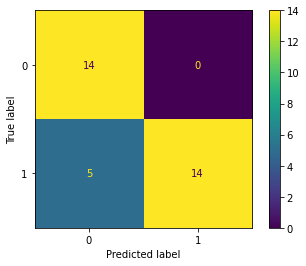

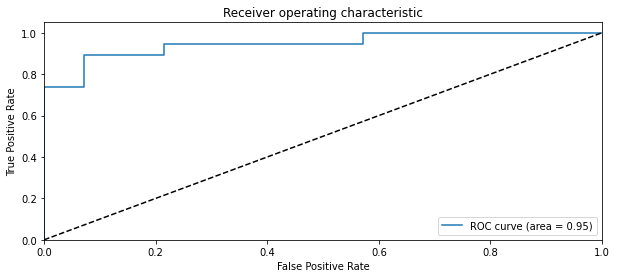

In [255]:
pred = clf.predict(test_x)
print("Gradient Boosting Classifier result using Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_y, pred) * 100))
print("Precision: {} %".format(precision_score(test_y, pred) * 100))
print("Recall: {} %".format(recall_score(test_y, pred) * 100))
print("F1-score: {} %".format(f1_score(test_y, pred) * 100))
print("Confusion Matrix:")
plot_confusion_matrix(clf, test_x, test_y)

y_pred_proba = clf.predict_proba(test_x)

fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba[:,1])

auc_score = auc(fpr, tpr)

plt.figure(figsize=(10,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % (auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [256]:
test_acc_res.append(accuracy_score(test_y, pred) * 100)
test_prec_res.append(precision_score(test_y, pred) * 100)
test_rec_res.append(recall_score(test_y, pred) * 100)
test_f1_res.append(f1_score(test_y, pred) * 100)

### Cross Validation

In [257]:
gb_classifier = GradientBoostingClassifier(random_state=0)
score_tree = cross_validate(gb_classifier, train_x_attr, train_y_attr, cv=5, scoring=('accuracy', 'precision', 'recall'), return_train_score=True)

print("Cross Validation Gradient Bossting Result")
print("Train Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100))
print("Test Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100))

Cross Validation Gradient Bossting Result
Train Averaged Scores
Accuracy: 100.0 %
Precision: 100.0 %
Recall: 100.0 %
Test Averaged Scores
Accuracy: 80.89473684210526 %
Precision: 87.41176470588236 %
Recall: 82.0 %


In [258]:
cv_train_acc_res.append(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100)
cv_train_prec_res.append(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100)
cv_train_rec_res.append(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100)
cv_test_acc_res.append(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100)
cv_test_prec_res.append(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100)
cv_test_rec_res.append(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100)

### Feature Importance

Feature: 0, Score: 0.61180
Feature: 1, Score: 0.00128
Feature: 2, Score: 0.02487
Feature: 3, Score: 0.19150
Feature: 4, Score: 0.11545
Feature: 5, Score: 0.05510


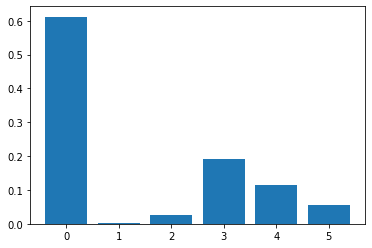

In [259]:
importance_gradient_boosting = clf.feature_importances_

for i,v in enumerate(importance_gradient_boosting):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_gradient_boosting))], importance_gradient_boosting)
plt.show()

## Ada Boost Classifier

In [260]:
clf = AdaBoostClassifier(n_estimators=100, random_state=0).fit(train_x, train_y)

### Result using Test Data

Ada Boost Classifier result using Test Data: 
-------------------------
Accuracy: 78.78787878787878 %
Precision: 92.85714285714286 %
Recall: 68.42105263157895 %
F1-score: 78.78787878787878 %
Confusion Matrix:


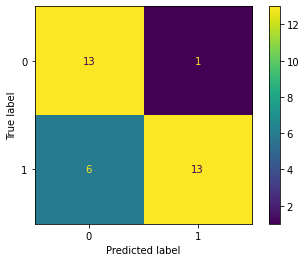

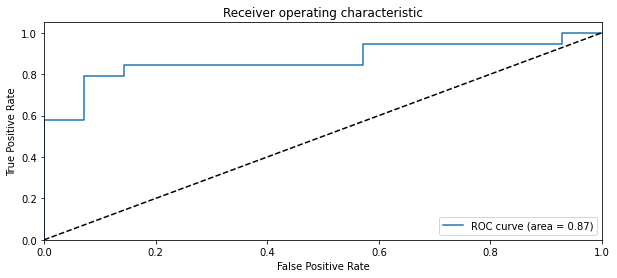

In [261]:
pred = clf.predict(test_x)
print("Ada Boost Classifier result using Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_y, pred) * 100))
print("Precision: {} %".format(precision_score(test_y, pred) * 100))
print("Recall: {} %".format(recall_score(test_y, pred) * 100))
print("F1-score: {} %".format(f1_score(test_y, pred) * 100))
print("Confusion Matrix:")
plot_confusion_matrix(clf, test_x, test_y)

y_pred_proba = clf.predict_proba(test_x)

fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba[:,1])

auc_score = auc(fpr, tpr)

plt.figure(figsize=(10,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % (auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [262]:
test_acc_res.append(accuracy_score(test_y, pred) * 100)
test_prec_res.append(precision_score(test_y, pred) * 100)
test_rec_res.append(recall_score(test_y, pred) * 100)
test_f1_res.append(f1_score(test_y, pred) * 100)

### Cross Validation

In [263]:
ab_classifier = AdaBoostClassifier(n_estimators=100, random_state=0)
score_tree = cross_validate(ab_classifier, train_x_attr, train_y_attr, cv=5, scoring=('accuracy', 'precision', 'recall'), return_train_score=True)

print("Cross Validation Ada Boost Result")
print("Train Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100))
print("Test Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100))

Cross Validation Ada Boost Result
Train Averaged Scores
Accuracy: 100.0 %
Precision: 100.0 %
Recall: 100.0 %
Test Averaged Scores
Accuracy: 83.84210526315789 %
Precision: 86.99855699855699 %
Recall: 84.00000000000001 %


In [264]:
cv_train_acc_res.append(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100)
cv_train_prec_res.append(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100)
cv_train_rec_res.append(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100)
cv_test_acc_res.append(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100)
cv_test_prec_res.append(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100)
cv_test_rec_res.append(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100)

### Feature Importance

Feature: 0, Score: 0.30000
Feature: 1, Score: 0.14000
Feature: 2, Score: 0.09000
Feature: 3, Score: 0.20000
Feature: 4, Score: 0.12000
Feature: 5, Score: 0.15000


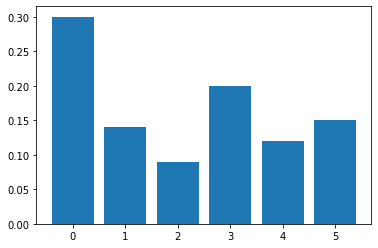

In [265]:
importance_ada_boost = clf.feature_importances_

for i,v in enumerate(importance_ada_boost):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_ada_boost))], importance_ada_boost)
plt.show()

## XGBoost

In [266]:
model = XGBClassifier()
model.fit(train_x, train_y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Result using Test Data

XGBoost result using Test Data: 
-------------------------
Accuracy: 87.87878787878788 %
Precision: 94.11764705882352 %
Recall: 84.21052631578947 %
F1-score: 88.88888888888889 %
Confusion Matrix:


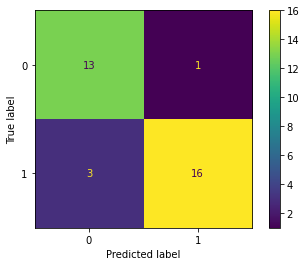

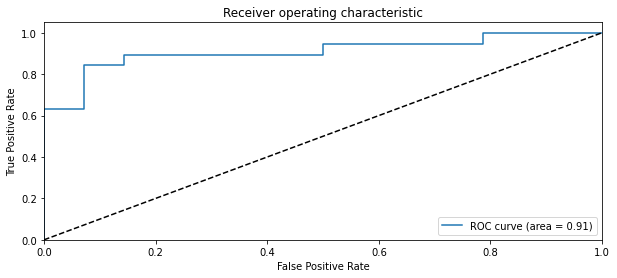

In [267]:
pred = model.predict(test_x)
print("XGBoost result using Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_y, pred) * 100))
print("Precision: {} %".format(precision_score(test_y, pred) * 100))
print("Recall: {} %".format(recall_score(test_y, pred) * 100))
print("F1-score: {} %".format(f1_score(test_y, pred) * 100))
print("Confusion Matrix:")
plot_confusion_matrix(model, test_x, test_y)

y_pred_proba = model.predict_proba(test_x)

fpr, tpr, thresholds = roc_curve(test_y, y_pred_proba[:,1])

auc_score = auc(fpr, tpr)

plt.figure(figsize=(10,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % (auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [268]:
test_acc_res.append(accuracy_score(test_y, pred) * 100)
test_prec_res.append(precision_score(test_y, pred) * 100)
test_rec_res.append(recall_score(test_y, pred) * 100)
test_f1_res.append(f1_score(test_y, pred) * 100)

### Cross Validation

In [269]:
xgb_classifier = XGBClassifier()
score_tree = cross_validate(xgb_classifier, train_x_attr, train_y_attr, cv=5, scoring=('accuracy', 'precision', 'recall'), return_train_score=True)

print("Cross Validation XGBoost Result")
print("Train Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100))
print("Test Averaged Scores")
print("Accuracy: {} %".format(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100))
print("Precision: {} %".format(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100))
print("Recall: {} %".format(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100))

Cross Validation XGBoost Result
Train Averaged Scores
Accuracy: 100.0 %
Precision: 100.0 %
Recall: 100.0 %
Test Averaged Scores
Accuracy: 83.78947368421052 %
Precision: 85.77777777777777 %
Recall: 86.0 %


In [270]:
cv_train_acc_res.append(np.sum(score_tree['train_accuracy'])/len(score_tree['train_accuracy']) * 100)
cv_train_prec_res.append(np.sum(score_tree['train_precision'])/len(score_tree['train_precision']) * 100)
cv_train_rec_res.append(np.sum(score_tree['train_recall'])/len(score_tree['train_recall']) * 100)
cv_test_acc_res.append(np.sum(score_tree['test_accuracy'])/len(score_tree['test_accuracy']) * 100)
cv_test_prec_res.append(np.sum(score_tree['test_precision'])/len(score_tree['test_precision']) * 100)
cv_test_rec_res.append(np.sum(score_tree['test_recall'])/len(score_tree['test_recall']) * 100)

### Feature Importance

Feature: 0, Score: 0.56885
Feature: 1, Score: 0.03309
Feature: 2, Score: 0.01484
Feature: 3, Score: 0.15569
Feature: 4, Score: 0.07552
Feature: 5, Score: 0.15200


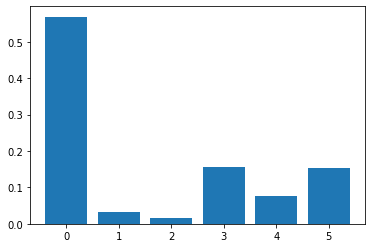

In [271]:
importance_xgboost = model.feature_importances_

for i,v in enumerate(importance_xgboost):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_xgboost))], importance_xgboost)
plt.show()

## Summary

### Train Test Split

In [272]:
model_name = ['Decision Tree','Random forest','Gradient Boosting','Ada Boost','Logistic Regression','XGBoost']

summary_train = pd.DataFrame(list(zip(model_name, test_acc_res, test_prec_res, test_rec_res, test_f1_res)), 
               columns =['name','test accuracy','test precision', 'test recall','test f1 score']) 
summary_train.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,test accuracy,test precision,test recall,test f1 score
0,Decision Tree,81.8182,93.3333,73.6842,82.3529
1,Random forest,90.9091,94.4444,89.4737,91.8919
2,Gradient Boosting,84.8485,100,73.6842,84.8485
3,Ada Boost,78.7879,92.8571,68.4211,78.7879
4,Logistic Regression,87.8788,94.1176,84.2105,88.8889


### Cross Validation

In [273]:
model_name = ['Decision Tree','Random forest','Gradient Boosting','Ada Boost','XGBoost']

summary_train = pd.DataFrame(list(zip(model_name, cv_train_acc_res, cv_train_prec_res, cv_train_rec_res, cv_test_acc_res, cv_test_prec_res, cv_test_rec_res)), 
               columns =['name','train accuracy','train precision', 'train recall','test accuracy','test precision', 'test recall']) 
summary_train.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,train accuracy,train precision,train recall,test accuracy,test precision,test recall
0,Decision Tree,100,100,100,72.8421,77.8324,74
1,Random forest,89.6487,86.4053,94.5,84.8947,84.4444,90
2,Gradient Boosting,100,100,100,80.8947,87.4118,82
3,Ada Boost,100,100,100,83.8421,86.9986,84
4,XGBoost,100,100,100,83.7895,85.7778,86


### Feature Importance

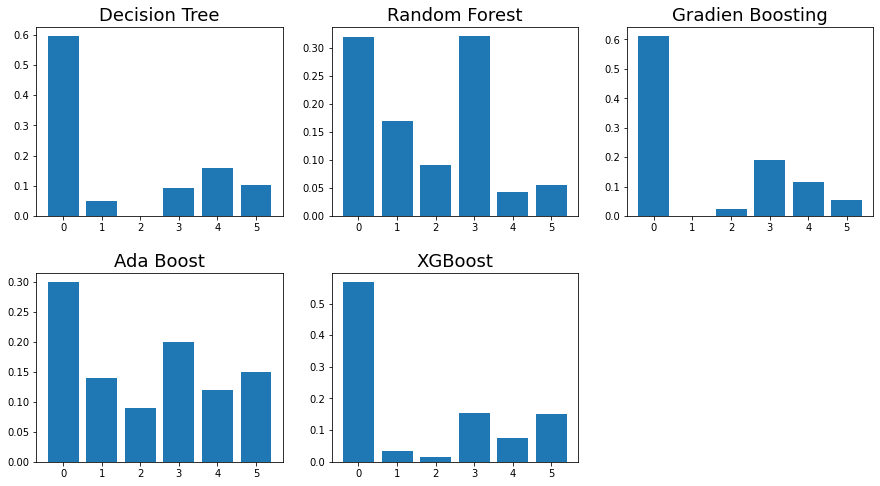

In [274]:
fig = plt.figure(figsize=(15, 8))
plt.subplots_adjust(hspace=0.3)

f1 = plt.subplot(2,3,1)
plt.title('Decision Tree', fontsize=18)
plt.bar([x for x in np.arange(len(importance_xgboost))], importance_decision_tree)

plt.subplot(2,3,2)
plt.title('Random Forest', fontsize=18)
plt.bar([x for x in np.arange(len(importance_random_forest))], importance_random_forest)

plt.subplot(2,3,3)
plt.title('Gradien Boosting', fontsize=18)
plt.bar([x for x in np.arange(len(importance_gradient_boosting))], importance_gradient_boosting)

plt.subplot(2,3,4)
plt.title('Ada Boost', fontsize=18)
plt.bar([x for x in np.arange(len(importance_ada_boost))], importance_ada_boost)

plt.subplot(2,3,5)
plt.title('XGBoost', fontsize=18)
plt.bar([x for x in np.arange(len(importance_xgboost))], importance_xgboost)

plt.show(); 

## Test using dataset lfw_compare

In [275]:
# Load dataset
lfw_df = pd.read_csv("dataset/lfw_compare.csv")
lfw_df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

In [276]:
lfw_df = lfw_df.dropna()
lfw_df["target"].value_counts()

0    888
1    678
Name: target, dtype: int64

In [277]:
lfw_prep_x = lfw_df.drop(columns=['target','is_different_gender'])
lfw_prep_y = lfw_df['target']

In [278]:
pred = model.predict(lfw_prep_x.values)
print("XGBoost result using LFW Test Data: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(lfw_prep_y.values, pred) * 100))

XGBoost result using LFW Test Data: 
-------------------------
Accuracy: 94.95530012771393 %


### Using Bootstrapping method

In [279]:
res = []
for i in np.arange(1000):
    sample = lfw_df.sample(n=250)
    pred = model.predict(sample.drop(columns=['target','is_different_gender']).values)  
    acc = accuracy_score(sample['target'].values, pred) * 100
    res.append(acc)

print("Max value: %s"%max(res))
print("Min value: %s"%min(res))
print("Avg value: %s"%(sum(res)/len(res)))

Max value: 98.4
Min value: 90.4
Avg value: 94.97359999999996


## Test using dataset test_ktp

In [280]:
# Load dataset
test_ktp_df = pd.read_csv("dataset/test_ktp.csv")
test_ktp_df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])
test_ktp_df.head(5)

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/ktp dan selfie approved/crop_ima...,0.476582,0.691073,0.693433,0.497831,4,0,2.772371e+07,0
1,face_cropping/ktp dan selfie approved/crop_ima...,0.422210,0.721475,0.525841,0.421616,7,0,2.608153e+07,0
2,face_cropping/ktp dan selfie approved/crop_ima...,NaN,NaN,NaN,0.590237,7,0,4.825943e+06,0
3,face_cropping/ktp dan selfie approved/crop_ima...,NaN,NaN,NaN,0.458911,0,0,3.320062e+07,0
4,face_cropping/ktp dan selfie approved/crop_ima...,0.567334,0.892473,0.853862,0.534230,4,1,2.484910e+07,0


In [281]:
test_ktp_df['target'].value_counts()

1    41
0    41
Name: target, dtype: int64

In [282]:
test_ktp_prep_x = test_ktp_df.drop(columns=['name','target','is_different_gender'])
test_ktp_prep_y = test_ktp_df['target']

In [283]:
pred_test_ktp = model.predict(test_ktp_prep_x.values)

print("XGBoost result using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y.values, pred_test_ktp) * 100))

XGBoost result using dataset test_ktp: 
-------------------------
Accuracy: 75.60975609756098 %


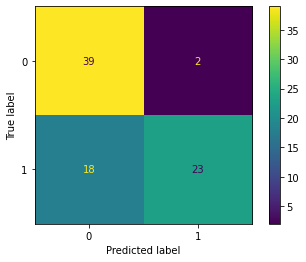

In [284]:
plot_confusion_matrix(model, test_ktp_prep_x.values, test_ktp_prep_y.values)

In [285]:
# Wrong prediction data
idx = [i for i,val in enumerate(pred_test_ktp) if val==1]

print([val[0].split('\\')[-1] for i,val in enumerate(test_ktp_df.values) if i in idx])

['ktp1248037565', 'ktp1597307935', 'ktp1084181158', 'ktp1086559103', 'ktp1116760379', 'ktp1154741040', 'ktp1207882382', 'ktp1309161228', 'ktp1322150005', 'ktp1344823393', 'ktp1384148463', 'ktp1425044233', 'ktp1488485490', 'ktp1538758670', 'ktp1574759130', 'ktp1597307935', 'ktp1680605548', 'ktp1771018960', 'ktp1813037311', 'ktp1823176004', 'ktp1826208632', 'ktp1954672276', 'SIM1388460247', 'sim1641425213', 'sim1969604226']


## Feature Selection

In [286]:
train_x_attr = train_prep.drop(columns=['name','is_different_gender','target'])
train_y_attr = train_prep['target']

lfw_prep_x = lfw_df.drop(columns=['target','is_different_gender'])
lfw_prep_y = lfw_df['target']

test_ktp_acc = []
lfw_acc = []
chosen_feature_list = []

clean_test_ktp_prep_x = test_ktp_df.dropna().drop(columns=['name','target','is_different_gender'])
clean_test_ktp_prep_y = test_ktp_df.dropna()['target']

## Correlation Filter feature selection

['face_recognition_dst' 'openface_OEN_dst' 'dlib_trained_model']


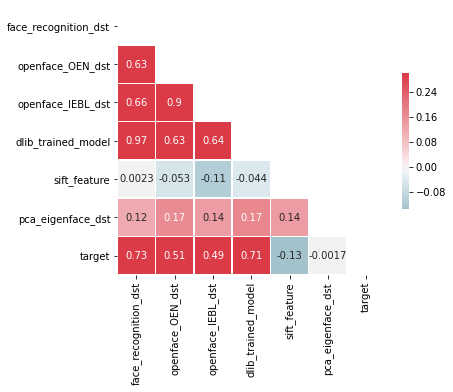

In [287]:
corr = df.drop(columns=['name','is_different_gender']).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(6, 5))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

corr_target = abs(corr["target"])
relevant_features = corr_target[corr_target>0.5]
chosen_feature = relevant_features.drop(['target'],axis=0).index.values
print(chosen_feature)

In [288]:
chosen_feature_list.append(chosen_feature)

In [289]:
model_2 = XGBClassifier()
model_2.fit(train_x_attr[chosen_feature], train_y_attr)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Test using dataset test_ktp

In [290]:
pred_model_2 = model_2.predict(test_ktp_prep_x[chosen_feature])
print("XGBoost result using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred_model_2) * 100))
test_ktp_acc.append(accuracy_score(test_ktp_prep_y, pred_model_2) * 100)

XGBoost result using dataset test_ktp: 
-------------------------
Accuracy: 87.8048780487805 %


### Test using dataset lfw

In [291]:
pred_model_2 = model_2.predict(lfw_prep_x[chosen_feature])
print("XGBoost result using dataset lfw: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred_model_2) * 100))
lfw_acc.append(accuracy_score(lfw_prep_y, pred_model_2) * 100)

XGBoost result using dataset lfw: 
-------------------------
Accuracy: 94.38058748403576 %


### Using Decision Tree

In [292]:
clf_tree = DecisionTreeClassifier().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf_tree.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = clf_tree.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 83.78378378378379 %
lfw Accuracy: 92.5925925925926 %


### Using SVM

In [293]:
svm = LinearSVC(random_state=0, tol=1e-5).fit(train_x_attr[chosen_feature], train_y_attr)
pred = svm.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = svm.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 90.54054054054053 %
lfw Accuracy: 94.38058748403576 %


### Using Gaussian Naive Bayes

In [294]:
clf = GaussianNB().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y.values, pred) * 100))
pred = clf.predict(lfw_prep_x[chosen_feature])
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 91.8918918918919 %
lfw Accuracy: 95.33844189016602 %


## Univariate feature selection

In [295]:
kb = SelectKBest(f_classif, k=4).fit(train_x_attr, train_y_attr)
chosen_feature = kb.get_support()
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]
train_x_uv = train_x_attr[chosen_feature]
print(chosen_feature)

['face_recognition_dst', 'openface_OEN_dst', 'openface_IEBL_dst', 'dlib_trained_model']


In [296]:
chosen_feature_list.append(chosen_feature)

In [297]:
model_2 = XGBClassifier()
model_2.fit(train_x_uv, train_y_attr)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Test using dataset test_ktp

In [298]:
pred_model_2 = model_2.predict(test_ktp_prep_x[chosen_feature])
print("XGBoost result using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred_model_2) * 100))
test_ktp_acc.append(accuracy_score(test_ktp_prep_y, pred_model_2) * 100)

XGBoost result using dataset test_ktp: 
-------------------------
Accuracy: 87.8048780487805 %


### Test using dataset lfw

In [299]:
pred_model_2 = model_2.predict(lfw_prep_x[chosen_feature])
print("XGBoost result using dataset lfw: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred_model_2) * 100))
lfw_acc.append(accuracy_score(lfw_prep_y, pred_model_2) * 100)

XGBoost result using dataset lfw: 
-------------------------
Accuracy: 94.12515964240103 %


### Using Decision tree

In [300]:
clf_tree = DecisionTreeClassifier().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf_tree.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = clf_tree.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 82.43243243243244 %
lfw Accuracy: 91.37931034482759 %


### Using SVM

In [301]:
svm = LinearSVC(random_state=0, tol=1e-5).fit(train_x_attr[chosen_feature], train_y_attr)
pred = svm.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = svm.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 90.54054054054053 %
lfw Accuracy: 94.38058748403576 %


### Using Gaussian Naive Bayes

In [302]:
clf = GaussianNB().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y.values, pred) * 100))
pred = clf.predict(lfw_prep_x[chosen_feature])
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 89.1891891891892 %
lfw Accuracy: 94.1890166028097 %


## Recursive Feature Elimination

In [303]:
#Initialize xgboost model
model_2 = XGBClassifier()

#Initializing RFE model
rfe = RFE(model_2, n_features_to_select=4).fit(train_x_attr,train_y_attr)

#Get selected feature
chosen_feature = rfe.support_
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]

x_rfe = train_x_attr[chosen_feature]

print(rfe.support_)
print(rfe.ranking_)
print(chosen_feature)

[ True False  True  True False  True]
[1 3 1 1 2 1]
['face_recognition_dst', 'openface_IEBL_dst', 'dlib_trained_model', 'pca_eigenface_dst']


In [304]:
chosen_feature_list.append(chosen_feature)

In [305]:
#Fitting the data to model
model_2.fit(x_rfe, train_y_attr)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Test using dataset test_ktp

In [306]:
pred_model_2 = model_2.predict(test_ktp_prep_x[chosen_feature])
print("XGBoost result using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred_model_2) * 100))
test_ktp_acc.append(accuracy_score(test_ktp_prep_y, pred_model_2) * 100)

XGBoost result using dataset test_ktp: 
-------------------------
Accuracy: 81.70731707317073 %


### Test using dataset lfw

In [307]:
pred_model_2 = model_2.predict(lfw_prep_x[chosen_feature])
print("XGBoost result using dataset lfw: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred_model_2) * 100))
lfw_acc.append(accuracy_score(lfw_prep_y, pred_model_2) * 100)

XGBoost result using dataset lfw: 
-------------------------
Accuracy: 94.12515964240103 %


### Using Decision Tree

In [308]:
#Initialize model
clf_tree = DecisionTreeClassifier()

#Initializing RFE model
rfe = RFE(clf_tree, n_features_to_select=4).fit(train_x_attr, train_y_attr)

#Get selected feature
chosen_feature = rfe.support_
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]

x_rfe = train_x_attr[chosen_feature]

print(rfe.support_)
print(rfe.ranking_)
print(chosen_feature)

clf_tree.fit(x_rfe, train_y_attr)

[ True False  True  True  True False]
[1 2 1 1 1 3]
['face_recognition_dst', 'openface_IEBL_dst', 'dlib_trained_model', 'sift_feature']


DecisionTreeClassifier()

In [309]:
pred = clf_tree.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = clf_tree.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 82.43243243243244 %
lfw Accuracy: 69.66794380587484 %


### Using SVM

In [310]:
#Initialize model
svm = LinearSVC(random_state=0,max_iter=10000)

#Initializing RFE model
rfe = RFE(svm, n_features_to_select=4).fit(train_x_attr, train_y_attr)

#Get selected feature
chosen_feature = rfe.support_
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]

x_rfe = train_x_attr[chosen_feature]

print(rfe.support_)
print(rfe.ranking_)
print(chosen_feature)

svm.fit(x_rfe, train_y_attr)

Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.


[False  True  True False  True  True]
[2 1 1 3 1 1]
['openface_OEN_dst', 'openface_IEBL_dst', 'sift_feature', 'pca_eigenface_dst']


Liblinear failed to converge, increase the number of iterations.


LinearSVC(max_iter=10000, random_state=0)

In [311]:
pred = svm.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = svm.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 48.64864864864865 %
lfw Accuracy: 56.70498084291188 %


## Selection using feature importance

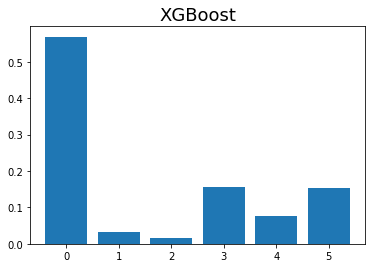

In [312]:
plt.title('XGBoost', fontsize=18)
plt.bar([x for x in np.arange(len(importance_xgboost))], importance_xgboost)
plt.show(); 

In [313]:
chosen_feature = [1,0,0,1,1,1]
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]
print(chosen_feature)

['face_recognition_dst', 'dlib_trained_model', 'sift_feature', 'pca_eigenface_dst']


In [314]:
chosen_feature_list.append(chosen_feature)

In [315]:
model_2 = XGBClassifier()
model_2.fit(train_x_attr[chosen_feature], train_y_attr)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Test using dataset test_ktp

In [316]:
pred_model_2 = model_2.predict(test_ktp_prep_x[chosen_feature])
print("XGBoost result using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred_model_2) * 100))
test_ktp_acc.append(accuracy_score(test_ktp_prep_y, pred_model_2) * 100)

XGBoost result using dataset test_ktp: 
-------------------------
Accuracy: 86.58536585365853 %


### Test using dataset lfw

In [317]:
pred_model_2 = model_2.predict(lfw_prep_x[chosen_feature])
print("XGBoost result using dataset lfw: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred_model_2) * 100))
lfw_acc.append(accuracy_score(lfw_prep_y, pred_model_2) * 100)

XGBoost result using dataset lfw: 
-------------------------
Accuracy: 93.93358876117497 %


### Using Decision Tree

Feature: 0, Score: 0.71719
Feature: 1, Score: 0.01571
Feature: 2, Score: 0.03135
Feature: 3, Score: 0.12921
Feature: 4, Score: 0.08633
Feature: 5, Score: 0.02020


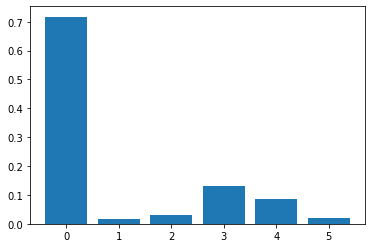

In [318]:
clf_tree = DecisionTreeClassifier().fit(train_x_attr, train_y_attr)
importance_decision_tree = clf_tree.feature_importances_

for i,v in enumerate(importance_decision_tree):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
plt.bar([x for x in np.arange(len(importance_decision_tree))], importance_decision_tree)
plt.show()

In [319]:
chosen_feature = [1,0,0,1,1,0]
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]
print(chosen_feature)

['face_recognition_dst', 'dlib_trained_model', 'sift_feature']


In [320]:
clf_tree = DecisionTreeClassifier().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf_tree.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = clf_tree.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 82.43243243243244 %
lfw Accuracy: 90.35759897828864 %


### Using SVM

In [321]:
svm = LinearSVC(random_state=0, tol=1e-5).fit(train_x_attr, train_y_attr)
for i in svm.coef_[0]:
    print(i)

Liblinear failed to converge, increase the number of iterations.


1.3032001180702016e-10
2.0152123005076482e-10
2.0674259537839305e-10
1.2424892355060628e-10
1.3744410195037316e-09
9.503992996154229e-08


In [322]:
chosen_feature = [1,1,1,1,1,1]
chosen_feature = [val for i,val in enumerate(train_x_attr.columns) if chosen_feature[i]]
print(chosen_feature)

['face_recognition_dst', 'openface_OEN_dst', 'openface_IEBL_dst', 'dlib_trained_model', 'sift_feature', 'pca_eigenface_dst']


In [323]:
svm = LinearSVC(random_state=0, tol=1e-5).fit(train_x_attr[chosen_feature], train_y_attr)
pred = svm.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y, pred) * 100))
pred = svm.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

Liblinear failed to converge, increase the number of iterations.


test_ktp Accuracy: 51.35135135135135 %
lfw Accuracy: 43.29501915708812 %


### Using Gaussian Naive Bayes

In [324]:
clf = GaussianNB().fit(train_x_attr, train_y_attr)
pred = clf.predict(clean_test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(clean_test_ktp_prep_y.values, pred) * 100))
pred = clf.predict(lfw_prep_x[chosen_feature])
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 59.45945945945946 %
lfw Accuracy: 42.1455938697318 %


## Feature Selection Summary

In [325]:
name = ['Correlation Filter','Univariate Feature Selection','Recursive Feature Elimination','Feature Importance']

pd.DataFrame(list(zip(name, test_ktp_acc, lfw_acc,chosen_feature_list)),columns =['name','test_ktp accuracy','lfw_accuracy','chosen_feature']).style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,test_ktp accuracy,lfw_accuracy,chosen_feature
0,Correlation Filter,87.8049,94.3806,['face_recognition_dst' 'openface_OEN_dst' 'dlib_trained_model']
1,Univariate Feature Selection,87.8049,94.1252,"['face_recognition_dst', 'openface_OEN_dst', 'openface_IEBL_dst', 'dlib_trained_model']"
2,Recursive Feature Elimination,81.7073,94.1252,"['face_recognition_dst', 'openface_IEBL_dst', 'dlib_trained_model', 'pca_eigenface_dst']"
3,Feature Importance,86.5854,93.9336,"['face_recognition_dst', 'dlib_trained_model', 'sift_feature', 'pca_eigenface_dst']"


Kesimpulan:\
Hampir semua metode feature selection menghasilkan feature :
    `face_recognition_dst`
    `dlib_trained_model`

## Testing with other model

In [326]:
chosen_feature = ['face_recognition_dst','dlib_trained_model']

test_ktp_prep_x = test_ktp_df.dropna()[chosen_feature]
test_ktp_prep_y = test_ktp_df.dropna()['target']

lfw_prep_x = lfw_df.dropna()[chosen_feature]
lfw_prep_y = lfw_df.dropna()['target']

### Decision Tree Classifier

In [327]:
clf_tree = DecisionTreeClassifier().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf_tree.predict(test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred) * 100))
pred = clf_tree.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 82.43243243243244 %
lfw Accuracy: 90.99616858237547 %


### SVM Classifier

In [328]:
svm = LinearSVC(random_state=0, tol=1e-5).fit(train_x_attr[chosen_feature], train_y_attr)
pred = svm.predict(test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred) * 100))
pred = svm.predict(lfw_prep_x[chosen_feature].values)
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 91.8918918918919 %
lfw Accuracy: 95.59386973180077 %


### Gaussian Naive Bayes

In [329]:
clf = GaussianNB().fit(train_x_attr[chosen_feature], train_y_attr)
pred = clf.predict(test_ktp_prep_x[chosen_feature])
print("test_ktp Accuracy: {} %".format(accuracy_score(test_ktp_prep_y.values, pred) * 100))
pred = clf.predict(lfw_prep_x[chosen_feature])
print("lfw Accuracy: {} %".format(accuracy_score(lfw_prep_y, pred) * 100))

test_ktp Accuracy: 94.5945945945946 %
lfw Accuracy: 96.48786717752235 %


Kesimpulan:\
Dengan menggunakan 2 fitur saja, menggunakan model Decision Tree, SVM dan Gauissian Naive Bayes menghasilkan akurasi yang tidak jauh berbeda dengan menggunakan xgboost

## Demo KTP

In [330]:
chosen_feature = ['face_recognition_dst','dlib_trained_model']

In [331]:
train_x_attr = train_prep[chosen_feature]
train_y_attr = train_prep['target']

xgb = XGBClassifier().fit(train_x_attr, train_y_attr)

### Demo 0 - selfie-ktp dan foto-ktp sama

In [332]:
# Load dataset
demo_0_df = pd.read_csv("dataset/demo_0.csv")
demo_0_df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/demo/crop_img_0,nan,nan,nan,0.614065,12,1,2.29391e+07,0


In [333]:
print(xgb.predict(demo_0_df[chosen_feature]))
print(xgb.predict_proba(demo_0_df[chosen_feature])[0])

[0]
[0.9821428 0.0178572]


### Demo 1 - selfie-ktp dan foto-ktp beda

In [334]:
# Load dataset
demo_1_df = pd.read_csv("dataset/demo_1.csv")
demo_1_df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/demo/crop_img_1,nan,nan,nan,0.672523,303,1,3.14959e+07,1


In [335]:
print(xgb.predict(demo_1_df[chosen_feature]))
print(xgb.predict_proba(demo_1_df[chosen_feature])[0])

[0]
[0.98167527 0.01832473]


### Demo 2 - selfie-ktp dan foto-ktp beda (higher quality image)

In [336]:
# Load dataset
demo_2_df = pd.read_csv("dataset/demo_2.csv")
demo_2_df.style.set_properties(**{'text-align': 'center'}).set_table_styles([ dict(selector='th', props=[('text-align', 'center')] ) ])

,name,face_recognition_dst,openface_OEN_dst,openface_IEBL_dst,dlib_trained_model,sift_feature,is_different_gender,pca_eigenface_dst,target
0,face_cropping/demo/crop_img_2,0.493471,0.58638,0.517399,0.529481,10,0,9.90671e+06,1


In [337]:
print(xgb.predict(demo_2_df[chosen_feature]))
print(xgb.predict_proba(demo_2_df[chosen_feature])[0])

[0]
[0.9559937  0.04400626]


## Tuning with Grid Search

In [338]:
param_grid = {'max_depth': [2, 4, 6, 8],
              'gamma': [0,1,5],
              'learning_rate':[0.01, 0.02, 0.05, 0.07, 0.1]
             }
search = GridSearchCV(model, param_grid, cv=5)

In [339]:
search.fit(train_x_attr[chosen_feature], train_y_attr)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0, gpu_id=-1,
                                     importance_type='gain',
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=0,
                                     num_parallel_tree=1, random_state=0,
                                     reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsample=1,
                                     tree_method='exact', validate_parameters=1,
         

In [340]:
search.best_params_

{'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4}

In [341]:
pred_after_tuning = search.predict(test_ktp_prep_x[chosen_feature])
print("XGBoost result after tuning using dataset test_ktp: ")
print("-------------------------")
print("Accuracy: {} %".format(accuracy_score(test_ktp_prep_y, pred_after_tuning) * 100))

XGBoost result after tuning using dataset test_ktp: 
-------------------------
Accuracy: 89.1891891891892 %


### Test tuned model to data demo_ktp

In [342]:
print(search.predict(demo_0_df[chosen_feature]))
print(search.predict_proba(demo_0_df[chosen_feature])[0])

[0]
[0.78549176 0.21450824]


In [343]:
print(search.predict(demo_1_df[chosen_feature]))
print(search.predict_proba(demo_1_df[chosen_feature])[0])

[0]
[0.78549176 0.21450824]


In [344]:
print(search.predict(demo_2_df[chosen_feature]))
print(search.predict_proba(demo_2_df[chosen_feature])[0])

[0]
[0.6755679  0.32443208]
